## Classificando o Risco de Acidentes nas Rodovias Federais Brasileiras



In [1]:
# Importando as bibliotecas:

import pandas as pd
import statistics  as sts
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
%matplotlib inline
import sys
import os
import pandas_profiling
import sweetviz as sv
from scipy.stats import mode
from datetime import datetime, date, time
import warnings
from sklearn.preprocessing import LabelEncoder
warnings.filterwarnings('ignore')
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score,recall_score, precision_score

# Coleta de Dados
##### Dados oficiais retirados diretamente da Polícia Rodoviária Federal (PRF), no site: https://portal.prf.gov.br/dados-abertos-acidentes

###### datatran2019.csv:  dados agrupados por ocorrência
###### acidentes2019_PESSOA.csv: dados agrupados por pessoa 

In [2]:
# Leitura dos datasets datatran2019 e acidentes2019_PESSOA.csv  pelo Pandas
# usando o comando parse_dates para organizar a coluna 'data_inversa' em ordem crescente
acidentes = pd.read_csv("datatran2019.csv", sep=';',encoding='latin-1', parse_dates=['data_inversa'])
acidentes_pessoa = pd.read_csv("acidentes2019_PESSOA.csv", sep=';',encoding='latin-1', parse_dates=['data_inversa'])


In [3]:
# Comando que, ao visualizar o dataframe,  mostra TODAS as colunas dos dataframes utilizados
pd.set_option('display.max_columns', None)

In [4]:
# Verificando as 10 primeiras linhas do Dataframe  "acidentes" 
acidentes.head(10)

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,182210.0,2019-01-01,terça-feira,01:30:00,SP,116.0,218,GUARULHOS,Falta de Atenção à Condução,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,4,0,4,0,0,0,4,1,"-23,46052014","-46,48772478",SR-SP,DEL6/1,UOP01/SP
1,182211.0,2019-01-01,terça-feira,01:30:00,PR,373.0,"177,3",PONTA GROSSA,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-25,05533957","-50,22776753",SR-PR,DEL7/3,UOP01/PR
2,182212.0,2019-01-01,terça-feira,00:45:00,SC,101.0,16,GARUVA,Animais na Pista,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-26,1216","-48,8826",SR-SC,DEL8/3,UOP01/SC
3,182214.0,2019-01-01,terça-feira,00:00:00,CE,20.0,"429,5",FORTALEZA,Ingestão de Substâncias Psicoativas,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,0,0,1,0,0,1,1,"-3,76999","-38,670063",SR-CE,DEL16/1,UOP02/CE
4,182215.0,2019-01-01,terça-feira,01:00:00,MG,381.0,327,NOVA ERA,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,0,0,1,1,0,1,2,"-19,7609","-43,0306",SR-MG,DEL4/3,UOP01/MG
5,182216.0,2019-01-01,terça-feira,01:50:00,SC,470.0,"42,6",GASPAR,Ingestão de Substâncias Psicoativas,Saída de leito carroçável,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Simples,Reta,Sim,1,0,1,0,0,0,1,1,"-26,875719","-49,003746",SR-SC,DEL8/4,UOP01/SC
6,182217.0,2019-01-01,terça-feira,01:30:00,MS,163.0,"721,5",COXIM,Animais na Pista,Atropelamento de Animal,Sem Vítimas,Plena Noite,Crescente,Céu Claro,Simples,Reta,Não,1,0,0,0,0,1,0,1,"-18,575739","-54,76353",SR-MS,DEL3/6,UOP01/MS
7,182219.0,2019-01-01,terça-feira,00:50:00,GO,50.0,"280,3",CATALAO,Desobediência às normas de trânsito pelo condutor,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,3,0,1,0,2,0,1,2,"-18,1784","-47,9362",SR-GO,DEL1/6,UOP01/GO
8,182220.0,2019-01-01,terça-feira,02:25:00,GO,60.0,172,GOIANIA,Desobediência às normas de trânsito pelo pedestre,Atropelamento de Pedestre,Com Vítimas Fatais,Plena Noite,Decrescente,Chuva,Dupla,Reta,Não,3,1,0,0,0,2,0,1,"-16,738","-49,4076",SR-GO,DEL1/1,UOP02/GO
9,182223.0,2019-01-01,terça-feira,02:15:00,RS,386.0,"73,7",BOA VISTA DAS MISSOES,Ingestão de Álcool,Colisão frontal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Curva,Sim,4,0,2,2,0,0,4,2,"-27,693541","-53,300945",SR-RS,DEL08,UOP02/RS


In [5]:
# Verificando as informações sobre os dataframe, incluindo a memória
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67446 entries, 0 to 67445
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      67446 non-null  float64       
 1   data_inversa            67446 non-null  datetime64[ns]
 2   dia_semana              67446 non-null  object        
 3   horario                 67446 non-null  object        
 4   uf                      67446 non-null  object        
 5   br                      67351 non-null  float64       
 6   km                      67351 non-null  object        
 7   municipio               67446 non-null  object        
 8   causa_acidente          67446 non-null  object        
 9   tipo_acidente           67446 non-null  object        
 10  classificacao_acidente  67446 non-null  object        
 11  fase_dia                67446 non-null  object        
 12  sentido_via             67446 non-null  object

In [6]:
# Dataframe 'acidentes': linhas e colunas
acidentes.shape

(67446, 30)

In [7]:
# conhecendo o dataframe acidentes_pessoa
acidentes_pessoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162273 entries, 0 to 162272
Data columns (total 35 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      162273 non-null  float64       
 1   pesid                   162272 non-null  float64       
 2   data_inversa            162273 non-null  datetime64[ns]
 3   dia_semana              162273 non-null  object        
 4   horario                 162273 non-null  object        
 5   uf                      162273 non-null  object        
 6   br                      162042 non-null  float64       
 7   km                      162042 non-null  object        
 8   municipio               162273 non-null  object        
 9   causa_acidente          162273 non-null  object        
 10  tipo_acidente           162273 non-null  object        
 11  classificacao_acidente  162273 non-null  object        
 12  fase_dia                162273

### Os dois datasets possuem vários atributos iguais, entretanto, há uma diferença significativa, em relação ao estudo: o primeiro, datatran2019, mostra o nº de acidentes, com os atributos de cada acidente. Já o segundo, acidentes2019_PESSOA, que provém da mesma base, individualiza as pessoas em cada acidente.
acidentes -- linhas 67446 x colunas: 30



acidentes_por_pessoa: linhas: 162273 x colunas: 35


#  Análise Exploratória dos Dados


Focaremos neste momento no estudo do daframe criado "acidentes"

#### Visualização do dataset com o Pandas Profiling

In [8]:
# Relatorio visual das colunas do dataframe
pandas_profiling.ProfileReport(acidentes,  title = "Relatório de criação de perfil do Pandas")

mortos
0    62854
1     4063
2      389
3       91
4       32
5       12
6        4
7        1
dtype: int64


<AxesSubplot:xlabel='mortos'>

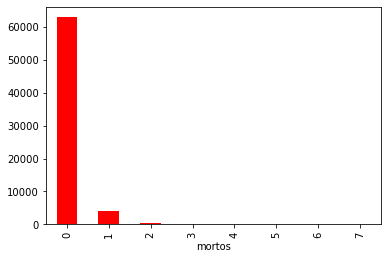

In [9]:
# Agrupando acidentes por mortes

agrupar_morte = acidentes.groupby(['mortos']).size()
print(agrupar_morte)
# verificando em um gráfico de barras
agrupar_morte.plot.bar(color = 'red')

In [10]:
# Verificando o total de mortes
Total_mortos = acidentes['mortos'].sum()
Total_pessoas = acidentes['pessoas'].sum()
print('Mortos = ', Total_mortos)
print('Pessoas envolvidas em acidentes = ', Total_pessoas)

Mortos =  5333
Pessoas envolvidas em acidentes =  162273


In [11]:
#Observando a porcentagem das mortes em relação ao número de pessoas envolvidas em acidentes
todos_envolvidos = acidentes['pessoas'].sum()
acidentes1 = round(acidentes[['ilesos','mortos','feridos_leves','feridos_graves', 'ignorados']].sum()/todos_envolvidos * 100, 1)
acidentes1

ilesos            42.3
mortos             3.3
feridos_leves     37.3
feridos_graves    11.4
ignorados          5.7
dtype: float64

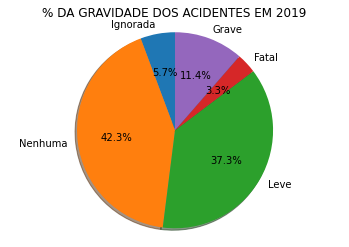

In [12]:
# Verificando em um gráfico de pizza
labels = 'Ignorada','Nenhuma', 'Leve','Fatal','Grave'
percentagem = [ 5.7, 42.3,37.3,3.3,11.4]

fig1, ax1 = plt.subplots()
ax1.pie(percentagem, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)

ax1.axis('equal')

#Título do gráfico
ax1.set_title('% DA GRAVIDADE DOS ACIDENTES EM 2019')

plt.show()



##### Verificando os dados acima, percebe-se que o número de mortes, em relação ao total de pessoas envolvidas, é relativamente baixo(3,3%), de forma que isso pode prejudicar a classificação nos algoritmos de Machine Learning(ML)


##### Entretanto, percebi que posso agregar os acidentes graves, juntamente aos fatais, fato de maior relevância para todo o estudo.




#### EXPLORANDO OUTROS ATRIBUTOS

dia_semana
domingo          11298
quarta-feira      8374
quinta-feira      8755
segunda-feira     9134
sexta-feira      10381
sábado           11099
terça-feira       8405
dtype: int64


<AxesSubplot:xlabel='dia_semana'>

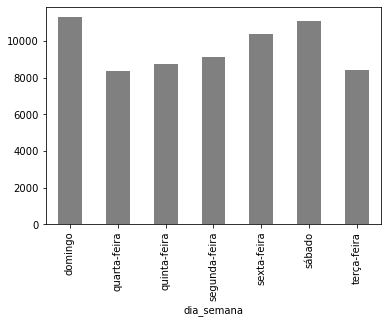

In [13]:
# Agrupando acidentes por dia da semana

agrupar_dia = acidentes.groupby(['dia_semana']).size()
print(agrupar_dia)
# verificando em um gráfico de barras
agrupar_dia.plot.bar(color = 'gray')

uf
AC     254
AL     629
AM     101
AP     128
BA    3471
CE    1694
DF    1090
ES    2842
GO    3354
MA    1075
MG    8720
MS    1435
MT    2137
PA     817
PB    1564
PE    2736
PI    1346
PR    7708
RJ    4606
RN    1437
RO    1533
RR     237
RS    4595
SC    8428
SE     612
SP    4377
TO     520
dtype: int64


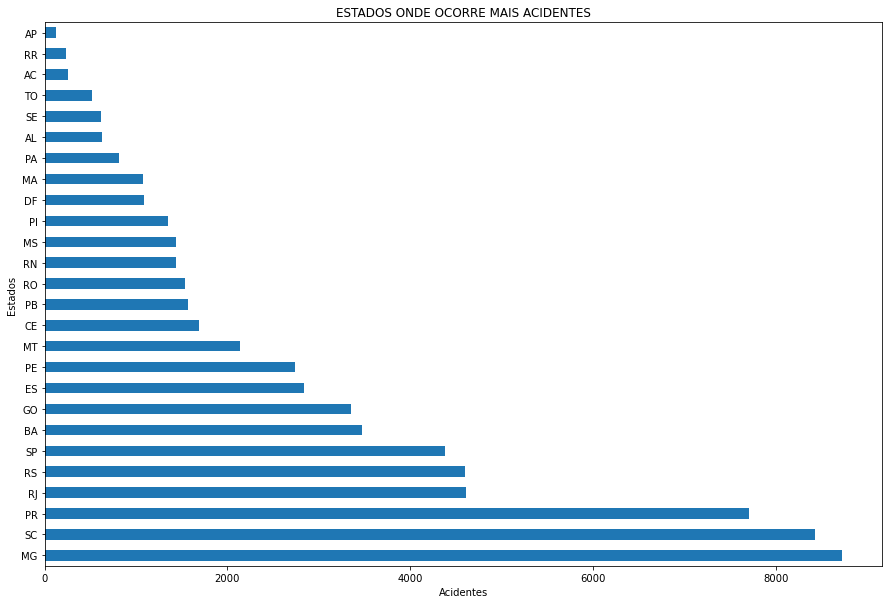

In [14]:
# Agrupando os acidentes por estado

agrupar_estado = acidentes.groupby(['uf']).size()
print(agrupar_estado)
# Estados em um gráfico de barra
fig = plt.figure(figsize=(15,10))
fig = acidentes['uf'].value_counts().head(26).plot.barh()
fig.set_title("ESTADOS ONDE OCORRE MAIS ACIDENTES")
fig.set_xlabel('Acidentes')
fig.set_ylabel('Estados')
plt.show();

br
10.0      366
20.0      933
30.0        7
40.0     3244
50.0      687
         ... 
484.0       2
487.0      17
488.0      30
493.0     261
495.0      19
Length: 115, dtype: int64


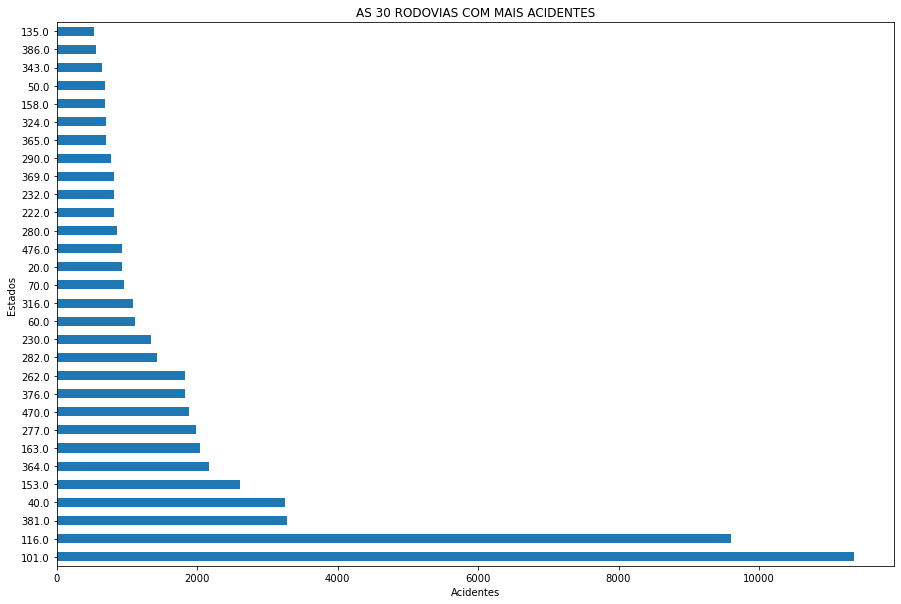

In [15]:
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#Agrupando as estradas

agrupar_rodovia = acidentes.groupby(['br']).size()
print(agrupar_rodovia)
# Número de acidentes nas 30 principais rodovias em um gráfico de barra
fig = plt.figure(figsize=(15,10))
fig = acidentes['br'].value_counts().head(30).plot.barh()
fig.set_title("AS 30 RODOVIAS COM MAIS ACIDENTES")
fig.set_xlabel('Acidentes')
fig.set_ylabel('Estados')
plt.show();

causa_acidente
Agressão Externa                                                                    384
Animais na Pista                                                                   1527
Avarias e/ou desgaste excessivo no pneu                                             799
Carga excessiva e/ou mal acondicionada                                              305
Condutor Dormindo                                                                  2483
Defeito Mecânico no Veículo                                                        3732
Defeito na Via                                                                      973
Deficiência ou não Acionamento do Sistema de Iluminação/Sinalização do Veículo      160
Desobediência às normas de trânsito pelo condutor                                  8098
Desobediência às normas de trânsito pelo pedestre                                   392
Falta de Atenção do Pedestre                                                       1971
Falta de Atenção 

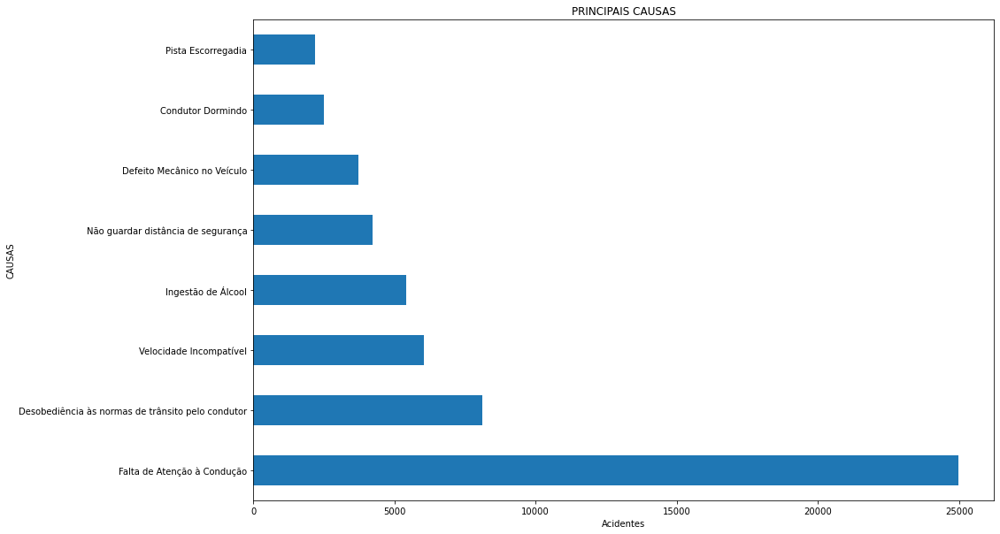

In [16]:
# Agrupando a causa do acidente
agrupandocausa = acidentes.groupby(['causa_acidente']).size()
print(agrupandocausa)

# 10 primeiros "Causas" em um gráfico de barra
fig = plt.figure(figsize=(15,10))
fig = acidentes['causa_acidente'].value_counts().head(8).plot.barh()
fig.set_title("PRINCIPAIS CAUSAS")
fig.set_xlabel('Acidentes')
fig.set_ylabel('CAUSAS')
plt.show();

tipo_acidente
Atropelamento de Animal             1237
Atropelamento de Pedestre           3380
Capotamento                         2274
Colisão com objeto em movimento      313
Colisão com objeto estático         4455
Colisão frontal                     4407
Colisão lateral                     8341
Colisão transversal                 8780
Colisão traseira                   13121
Danos eventuais                      181
Derramamento de carga                166
Engavetamento                        921
Incêndio                            1113
Queda de ocupante de veículo        3300
Saída de leito carroçável          10304
Tombamento                          5153
dtype: int64


<AxesSubplot:xlabel='tipo_acidente'>

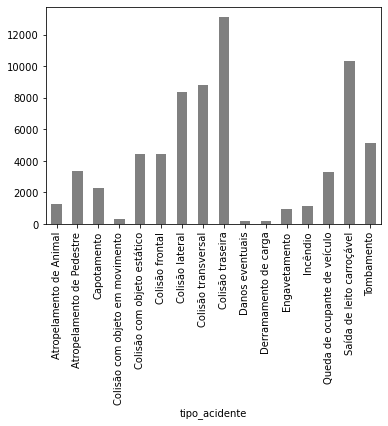

In [17]:
# Agrupando o tipo de acidente
agrupandotipo = acidentes.groupby(['tipo_acidente']).size()
print(agrupandotipo)
# verificando em um gráfico de barras
agrupandotipo.plot.bar(color = 'gray')

classificacao_acidente
Com Vítimas Fatais      4592
Com Vítimas Feridas    51183
Sem Vítimas            11671
dtype: int64


<AxesSubplot:xlabel='classificacao_acidente'>

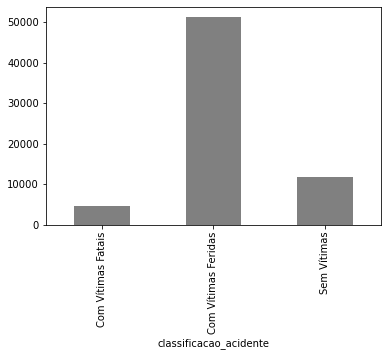

In [18]:
# agrupando a classificação do acidente
agrupandoclassificacao = acidentes.groupby(['classificacao_acidente']).size()
print(agrupandoclassificacao)
agrupandoclassificacao.plot.bar(color = 'gray')


##### Acima, mais uma vez, verifica-se a quantidade consideravel de acidentes com vítimas, o que dá um maior ensejo ao desenvolvimento do trabalho de ter um público alvo as vitimas fatais E os gravemente feridos

fase_dia
Amanhecer       3279
Anoitecer       3684
Plena Noite    23563
Pleno dia      36920
dtype: int64


<AxesSubplot:xlabel='fase_dia'>

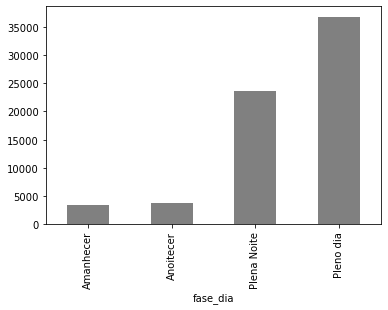

In [19]:
# agrupando a fase do dia do acidente
agrupandodia = acidentes.groupby(['fase_dia']).size()
print(agrupandodia)
agrupandodia.plot.bar(color = 'gray')

condicao_metereologica
Chuva                7216
Céu Claro           39370
Garoa/Chuvisco       2305
Granizo                 4
Ignorado              995
Neve                    1
Nevoeiro/Neblina      554
Nublado             11575
Sol                  5289
Vento                 137
dtype: int64


<AxesSubplot:xlabel='condicao_metereologica'>

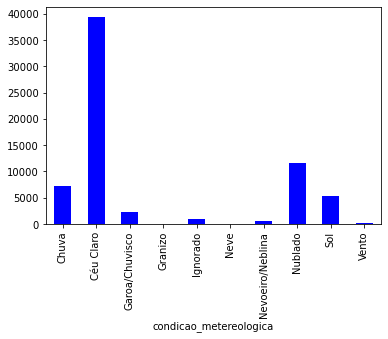

In [20]:
# agrupando a fase do dia do acidente
agrupando_tempo= acidentes.groupby(['condicao_metereologica']).size()
print(agrupando_tempo)
agrupando_tempo.plot.bar(color = 'blue')



tipo_pista
Dupla       27747
Múltipla     5420
Simples     34279
dtype: int64


<AxesSubplot:xlabel='tipo_pista'>

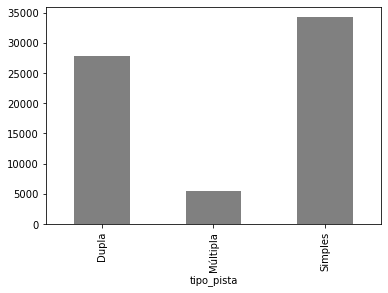

In [20]:
# agrupando o tipo de pista
agrupando_pista= acidentes.groupby(['tipo_pista']).size()
print(agrupando_pista)
agrupando_pista.plot.bar(color = 'gray')



veiculos
1     29974
2     32253
3      3971
4       837
5       270
6        91
7        25
8         9
9         5
10        4
11        4
12        2
14        1
dtype: int64


<AxesSubplot:xlabel='veiculos'>

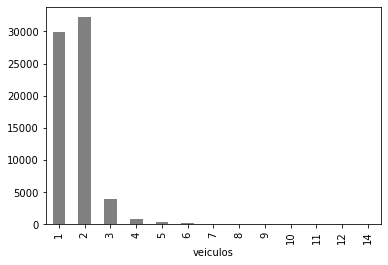

In [21]:
# agrupando o numero de veiculos
agrupando_veiculos= acidentes.groupby(['veiculos']).size()
print(agrupando_veiculos)
agrupando_veiculos.plot.bar(color = 'gray')

In [22]:
acidentes.corr()

,id,br,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos
id,1.000000,0.006823,0.001768,0.006651,-0.005995,0.011893,-0.002728,0.011914,0.000494,0.006417
br,0.006823,1.000000,0.019569,0.014741,0.009176,0.022328,0.005839,0.001937,0.019230,0.014212
pessoas,0.001768,0.019569,1.000000,0.163523,0.532367,0.266335,0.727698,0.144561,0.608227,0.422014
mortos,0.006651,0.014741,0.163523,1.000000,-0.058207,0.092216,-0.016988,0.086468,-0.006677,0.039873
feridos_leves,-0.005995,0.009176,0.532367,-0.058207,1.000000,-0.051631,-0.002240,-0.069949,0.870375,0.072029
feridos_graves,0.011893,0.022328,0.266335,0.092216,-0.051631,1.000000,-0.054733,0.032016,0.446795,0.064686
ilesos,-0.002728,0.005839,0.727698,-0.016988,-0.002240,-0.054733,1.000000,-0.058582,-0.028992,0.439400
ignorados,0.011914,0.001937,0.144561,0.086468,-0.069949,0.032016,-0.058582,1.000000,-0.046877,0.094090
feridos,0.000494,0.019230,0.608227,-0.006677,0.870375,0.446795,-0.028992,-0.046877,1.000000,0.096419
veiculos,0.006417,0.014212,0.422014,0.039873,0.072029,0.064686,0.439400,0.094090,0.096419,1.000000


In [23]:
acidentes.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,182210.0,2019-01-01,terça-feira,01:30:00,SP,116.0,218,GUARULHOS,Falta de Atenção à Condução,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,4,0,4,0,0,0,4,1,"-23,46052014","-46,48772478",SR-SP,DEL6/1,UOP01/SP
1,182211.0,2019-01-01,terça-feira,01:30:00,PR,373.0,"177,3",PONTA GROSSA,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-25,05533957","-50,22776753",SR-PR,DEL7/3,UOP01/PR
2,182212.0,2019-01-01,terça-feira,00:45:00,SC,101.0,16,GARUVA,Animais na Pista,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-26,1216","-48,8826",SR-SC,DEL8/3,UOP01/SC
3,182214.0,2019-01-01,terça-feira,00:00:00,CE,20.0,"429,5",FORTALEZA,Ingestão de Substâncias Psicoativas,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,0,0,1,0,0,1,1,"-3,76999","-38,670063",SR-CE,DEL16/1,UOP02/CE
4,182215.0,2019-01-01,terça-feira,01:00:00,MG,381.0,327,NOVA ERA,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,0,0,1,1,0,1,2,"-19,7609","-43,0306",SR-MG,DEL4/3,UOP01/MG


### A partir da visualização dos principais atributos, decidi por fazer uma junção de dois atributos do dataset datatran2019 : "mortos" + "feridos_graves". Vejamos:

In [24]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67446 entries, 0 to 67445
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      67446 non-null  float64       
 1   data_inversa            67446 non-null  datetime64[ns]
 2   dia_semana              67446 non-null  object        
 3   horario                 67446 non-null  object        
 4   uf                      67446 non-null  object        
 5   br                      67351 non-null  float64       
 6   km                      67351 non-null  object        
 7   municipio               67446 non-null  object        
 8   causa_acidente          67446 non-null  object        
 9   tipo_acidente           67446 non-null  object        
 10  classificacao_acidente  67446 non-null  object        
 11  fase_dia                67446 non-null  object        
 12  sentido_via             67446 non-null  object

In [25]:
# ****************** CRIANDO O DATAFRAME 'risco_grave" COM APENAS OS ATRIBUTOS mortos e feridos_graves
risco_grave = pd.read_csv("datatran2019.csv", sep=';',encoding='latin-1', usecols=[18,20])
risco_grave.head(10)

,mortos,feridos_graves
0,0,0
1,0,0
2,0,0
3,0,1
4,0,1
5,0,0
6,0,0
7,0,0
8,1,0
9,0,2


In [26]:
risco_grave.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67446 entries, 0 to 67445
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   mortos          67446 non-null  int64
 1   feridos_graves  67446 non-null  int64
dtypes: int64(2)
memory usage: 1.0 MB


In [27]:
risco_grave.shape
# mesmo número de linhas do dataframe 'acidentes'

(67446, 2)

In [28]:
#criando a coluna 'risco', que será a CLASSE do nosso estudo,  para unir(SOMAR) os valores de 'mortos' + 'feridos_graves'
risco_grave['risco'] = risco_grave.sum(axis=1)
risco_grave.loc[40:50]

,mortos,feridos_graves,risco
40,0,0,0
41,0,0,0
42,0,0,0
43,0,0,0
44,0,0,0
45,0,0,0
46,0,1,1
47,1,1,2
48,1,1,2
49,0,0,0


In [29]:
# agrupando os dados da minha classe, alvo do estudo
agrupar_risco= risco_grave.groupby('risco').size()
print(agrupar_risco)

risco
0     49193
1     14687
2      2476
3       587
4       276
5       134
6        44
7        21
8         6
9         7
10        4
11        1
12        2
13        2
14        2
17        1
20        1
21        1
23        1
dtype: int64


#### Interpretando o agrupamento acima, como exemplo, tivemos 44 acidentes em que houve 6 pessoas que ficaram mortas ou com ferimentos graves em 2019.

In [30]:
# Somando as mortes com feridos_graves
total_risco_grave = risco_grave['risco'].sum()
total_mortos = risco_grave['mortos'].sum()
total_feridos_graves = risco_grave['feridos_graves'].sum()
print( f" O número de pessoas que morreram ou tiveram ferimentos graves foi: {total_risco_grave}")
print( f" O número de pessoas que morreram  foi: {total_mortos}")
print( f" O número de pessoas que tiveram ferimentos graves foi: {total_feridos_graves}")


 O número de pessoas que morreram ou tiveram ferimentos graves foi: 23906
 O número de pessoas que morreram  foi: 5333
 O número de pessoas que tiveram ferimentos graves foi: 18573


In [31]:
# RETIRANDO OS ATRIBUTOS 'mortos' e 'feridos_graves'
risco_grave = risco_grave.drop(columns=['mortos', 'feridos_graves'])


In [32]:
risco_grave.head(10)


,risco
0,0
1,0
2,0
3,1
4,1
5,0
6,0
7,0
8,1
9,2


In [34]:
#TRANSFORMANDO O DATAFRAME EM BOOLEANO
risco_grave = risco_grave.astype(bool)
risco_grave.head(20)

## VALORES = 0 >>>> ASSUMEM O VALOR FALSE
## VALORES DIFERENTES DE 0 >>>> VALOR TRUE >> REPRESENTA OS ACIDENTES FATAIS OU COM RISCO GRAVE

,risco
0,False
1,False
2,False
3,True
4,True
5,False
6,False
7,False
8,True
9,True


In [35]:
agrupar_risco= risco_grave.groupby('risco').size()
print(agrupar_risco)

risco
False    49193
True     18253
dtype: int64


#### Em relação ao agrupamento acima, impende informar que os valores "True" NÃO INDICAM o número de pessoas que se acidentaram de forma grave ou morreram. Esse valor indica o NUMERO DE ACIDENTES em que houve morte ou pessoas gravemente feridas. 

In [36]:
# UNINDO O DATAFRAME "acidentes" com o "risco_grave"

risco_acidentes = pd.concat([acidentes,risco_grave], axis=1, join='inner')

In [37]:
risco_acidentes.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop,risco
0,182210.0,2019-01-01,terça-feira,01:30:00,SP,116.0,218,GUARULHOS,Falta de Atenção à Condução,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Crescente,Céu Claro,Múltipla,Curva,Sim,4,0,4,0,0,0,4,1,"-23,46052014","-46,48772478",SR-SP,DEL6/1,UOP01/SP,False
1,182211.0,2019-01-01,terça-feira,01:30:00,PR,373.0,"177,3",PONTA GROSSA,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Plena Noite,Crescente,Nublado,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-25,05533957","-50,22776753",SR-PR,DEL7/3,UOP01/PR,False
2,182212.0,2019-01-01,terça-feira,00:45:00,SC,101.0,16,GARUVA,Animais na Pista,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Céu Claro,Dupla,Reta,Sim,1,0,1,0,0,0,1,1,"-26,1216","-48,8826",SR-SC,DEL8/3,UOP01/SC,False
3,182214.0,2019-01-01,terça-feira,00:00:00,CE,20.0,"429,5",FORTALEZA,Ingestão de Substâncias Psicoativas,Colisão com objeto estático,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Dupla,Viaduto,Sim,1,0,0,1,0,0,1,1,"-3,76999","-38,670063",SR-CE,DEL16/1,UOP02/CE,True
4,182215.0,2019-01-01,terça-feira,01:00:00,MG,381.0,327,NOVA ERA,Falta de Atenção à Condução,Colisão transversal,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Interseção de vias,Não,2,0,0,1,1,0,1,2,"-19,7609","-43,0306",SR-MG,DEL4/3,UOP01/MG,True


In [38]:
risco_acidentes.shape
#NOVO DATAFRAME COM UMA COLUNA A MAIS, JUSTAMENTE A COLUNA 'risco' QUE SERÁ A NOSSA CLASSE

(67446, 31)

#####  - COM COMANDOS MAIS SIMPLES, SERIA POSSÍVEL UNIR OS ATRIBUTOS 'mortos' e 'acidentes_graves'. ENTRETANTO, OPTEI POR ESSA FORMA PARA QUE ESSA UNIÃO FOSSE MAIS EXPLICATIVA E DIDÁTICA. 

COMANDO ALTERNATIVO EM UMA LINHA: acidentes['risco'] = acidentes['mortos'] + acidentes['feridos_graves']


In [39]:
risco_acidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67446 entries, 0 to 67445
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      67446 non-null  float64       
 1   data_inversa            67446 non-null  datetime64[ns]
 2   dia_semana              67446 non-null  object        
 3   horario                 67446 non-null  object        
 4   uf                      67446 non-null  object        
 5   br                      67351 non-null  float64       
 6   km                      67351 non-null  object        
 7   municipio               67446 non-null  object        
 8   causa_acidente          67446 non-null  object        
 9   tipo_acidente           67446 non-null  object        
 10  classificacao_acidente  67446 non-null  object        
 11  fase_dia                67446 non-null  object        
 12  sentido_via             67446 non-null  object

Text(0, 0.5, 'Qtide')

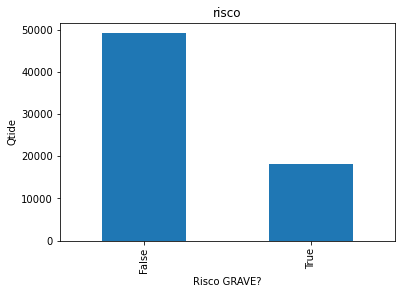

In [40]:
# a coluna alvo é bastante desbalanceada. Isso precisará ser tratado mais adiante
ax = risco_acidentes['risco'].value_counts().plot(kind="bar", title='risco')
ax.set_xlabel("Risco GRAVE?")
ax.set_ylabel("Qtide")

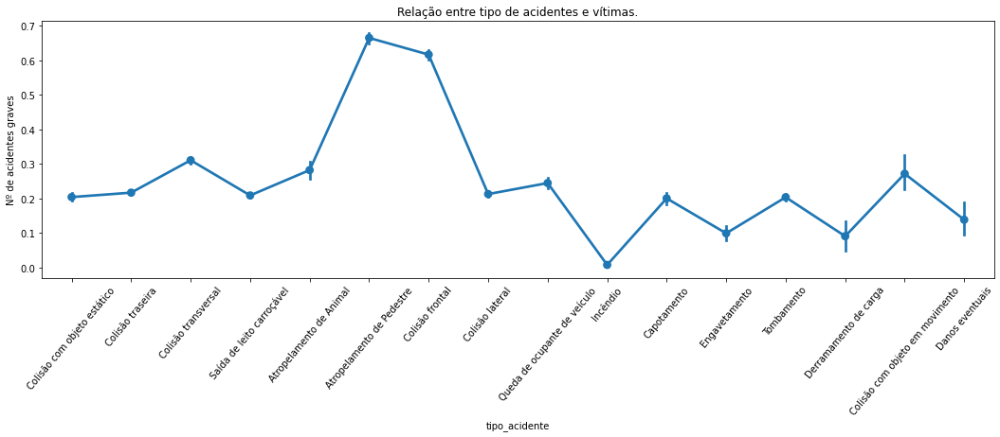

In [41]:
 PLOTAR  GRÁFICO

plt.figure(figsize=(18,5))
sns.pointplot(x='tipo_acidente', y='risco',data=risco_acidentes)
plt.xticks(rotation=50)
plt.title('Relação entre tipo de acidentes e vítimas.')
plt.ylabel('Nº de acidentes graves')
plt.show();

## Trabalhando o dataset >>>> 'acidentes2019_PESSOAS'


In [42]:
acidentes_pessoa.head()

,id,pesid,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,id_veiculo,tipo_veiculo,marca,ano_fabricacao_veiculo,tipo_envolvido,estado_fisico,idade,sexo,ilesos,feridos_leves,feridos_graves,mortos,latitude,longitude,regional,delegacia,uop
0,182256.0,403856.0,2019-01-01,terça-feira,04:00:00,CE,116.0,"136,9",RUSSAS,Animais na Pista,Atropelamento de Animal,Sem Vítimas,Amanhecer,Decrescente,Vento,Simples,Curva,Não,324937,Caminhão,I/MB 15SPRINT RONTAN AMB,2012.0,Condutor,Ileso,35.0,Masculino,1,0,0,0,"-4,766018","-38,056034",SR-CE,DEL16/3,UOP01/CE
1,182263.0,402859.0,2019-01-01,terça-feira,05:00:00,MT,158.0,"599,5",AGUA BOA,Defeito Mecânico no Veículo,Incêndio,Sem Vítimas,Amanhecer,Decrescente,Garoa/Chuvisco,Simples,Reta,Não,324940,Caminhão,FORD/CARGO 815 N,2011.0,Condutor,Ileso,30.0,Masculino,1,0,0,0,"-14,319","-52,169",SR-MT,DEL2/8,UOP02/MT
2,182277.0,402850.0,2019-01-01,terça-feira,10:00:00,PA,10.0,34,DOM ELISEU,Velocidade Incompatível,Colisão traseira,Sem Vítimas,Pleno dia,Decrescente,Nublado,Simples,Não Informado,Não,324958,Caminhão-trator,VOLVO/FH 540 6X4T,2012.0,Condutor,Ileso,54.0,Masculino,1,0,0,0,"-4,15296734","-47,54608154",SR-PA,DEL19/2,UOP03/PA
3,182289.0,402431.0,2019-01-01,terça-feira,08:30:00,BA,101.0,13,RIO REAL,Ingestão de Álcool,Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Dupla,Desvio Temporário,Não,324987,Caminhão-trator,SCANIA/R 440 A6X2,2018.0,Condutor,Ileso,43.0,Masculino,1,0,0,0,"-11,5896","-37,8761",SR-SE,DEL20/2,UOP03/SE
4,182307.0,402642.0,2019-01-01,terça-feira,13:50:00,BA,116.0,440,FEIRA DE SANTANA,Ingestão de Álcool,Saída de leito carroçável,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Dupla,Curva,Não,325030,Caminhão-trator,VOLVO/FH12 380 4X2T,2003.0,Passageiro,Lesões Graves,37.0,Masculino,0,0,1,0,"-12,344","-39,087",SR-BA,DEL10/2,UOP01/BA


In [43]:
acidentes_pessoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162273 entries, 0 to 162272
Data columns (total 35 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      162273 non-null  float64       
 1   pesid                   162272 non-null  float64       
 2   data_inversa            162273 non-null  datetime64[ns]
 3   dia_semana              162273 non-null  object        
 4   horario                 162273 non-null  object        
 5   uf                      162273 non-null  object        
 6   br                      162042 non-null  float64       
 7   km                      162042 non-null  object        
 8   municipio               162273 non-null  object        
 9   causa_acidente          162273 non-null  object        
 10  tipo_acidente           162273 non-null  object        
 11  classificacao_acidente  162273 non-null  object        
 12  fase_dia                162273

In [44]:
# ****************** CRIANDO UM DATAFRAME COM APENAS OS ATRIBUTOS tipo veiculo
# dataframe proveniente do segundo dataset
tipo_veiculo = pd.read_csv("acidentes2019_PESSOA.csv", sep=';',encoding='latin-1',usecols=[0,19])
tipo_veiculo.head(10)

,id,tipo_veiculo
0,182256.0,Caminhão
1,182263.0,Caminhão
2,182277.0,Caminhão-trator
3,182289.0,Caminhão-trator
4,182307.0,Caminhão-trator
5,182307.0,Caminhão-trator
6,182316.0,Caminhão-trator
7,182334.0,Caminhão
8,182361.0,Caminhão-trator
9,182362.0,Caminhão


In [45]:
# INDEXANDO O DATAFRAME COM a "id"
tipo_veiculo.set_index('id', inplace=True)

In [46]:
tipo_veiculo.head()

,tipo_veiculo
id,
182256.0,Caminhão
182263.0,Caminhão
182277.0,Caminhão-trator
182289.0,Caminhão-trator
182307.0,Caminhão-trator


In [47]:
agrupando_tipo= tipo_veiculo.groupby('tipo_veiculo').size()
print(agrupando_tipo)

tipo_veiculo
Automóvel            70650
Bicicleta             2086
Caminhonete          14228
Caminhão             11517
Caminhão-trator      12068
Camioneta             4160
Carro de mão             6
Carroça-charrete        96
Ciclomotor             441
Micro-ônibus          1489
Motocicleta          31858
Motoneta              3746
Não Informado           39
Outros                 662
Quadriciclo              3
Reboque                 43
Semireboque            119
Trator de esteira        1
Trator de rodas         71
Trator misto             5
Trem-bonde               8
Triciclo                23
Utilitário            1900
Ônibus                7054
dtype: int64


In [48]:
tipo_veiculo.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 162273 entries, 182256.0 to 266627.0
Data columns (total 1 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   tipo_veiculo  162273 non-null  object
dtypes: object(1)
memory usage: 2.5+ MB


## AGREGANDO ALGUNS VALORES DESSES VEÍCULOS, DA SEGUINTE FORMA:

###### 1 - Bicicleta = Bicileta + Carro de mão  
###### 2 - Carroça = Carroça-charrete 
###### 3 - Reboque = Reboque + Semireboque 
###### 4 - Motocicleta = Motocicleta + Motoneta + Triciclo + Quadriciclo + Ciclomotor 
###### 5 - Automovel = Automóvel + Não Informado + Outros
###### 6 - Caminhonete = Caminhonete + Camioneta 
###### 7 - Trator =  Trator de esteira + Trator de rodas +  Trator misto 
###### 8 - Trem = Trem-bonde
###### 9 - Caminhão = Caminhão + Caminhão-Trator 
###### 10 - Ônibus = Ônibus + Micro-ônibus + Utilitário 


In [49]:
# Tratando a coluna 'tipo_veiculo':
tipo_veiculo.tipo_veiculo.replace(['Carro de mão', 'Carroça-charrete', 'Semireboque'],['Bicicleta', 'Carroça', 'Reboque'], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Ciclomotor','Triciclo','Quadriciclo', 'Motoneta'],'Motocicleta', inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Caminhão-trator','Camioneta','Trem-bonde'],['Caminhão','Caminhonete','Trem'], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Trator de rodas','Trator misto','Trator de esteira'],'Trator', inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Utilitário','Micro-ônibus'],'Ônibus', inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Não Informado','Outros'],'Automóvel', inplace=True)

In [50]:
agrupando_tipo= tipo_veiculo.groupby('tipo_veiculo').size()
print(agrupando_tipo)

tipo_veiculo
Automóvel      71351
Bicicleta       2092
Caminhonete    18388
Caminhão       23585
Carroça           96
Motocicleta    36071
Reboque          162
Trator            77
Trem               8
Ônibus         10443
dtype: int64


In [51]:
# TRANSFORMANDO CADA TIPO DE VEÍCULO EM NÚMERO
tipo_veiculo.tipo_veiculo.replace(['Bicicleta', 'Carroça', 'Reboque', 'Motocicleta'],[1, 2, 3, 4], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Automóvel', 'Caminhonete','Trator','Trem'], [5,6,7,8], inplace=True)
tipo_veiculo.tipo_veiculo.replace(['Caminhão', 'Ônibus'],[9,10], inplace=True)

In [52]:
agrupando_tipo= tipo_veiculo.groupby('tipo_veiculo').size()
print(agrupando_tipo)

tipo_veiculo
1      2092
2        96
3       162
4     36071
5     71351
6     18388
7        77
8         8
9     23585
10    10443
dtype: int64


In [53]:
tipo_veiculo.head(10)

,tipo_veiculo
id,
182256.0,9
182263.0,9
182277.0,9
182289.0,9
182307.0,9
182307.0,9
182316.0,9
182334.0,9
182361.0,9


## VERIFICANDO DADOS DUPLICADOS

In [54]:
# Verificando se há registros duplicados.
acidentes[acidentes.duplicated() == True].shape[0]
print(f"O número de registros duplicados é: {acidentes[acidentes.duplicated() == True].shape[0]}")

O número de registros duplicados é: 0


#  UNIÃO DE DOIS DATASETS

In [55]:
# Fazendo a união de dois datasets diferentes pelo id, através do comando .merge()
dataframesuniao = risco_acidentes.merge(tipo_veiculo, on='id', how='inner' )

In [56]:
# Ordenando com o "tipo_veiculo", na ordem decrescente
dataframesuniao = dataframesuniao.sort_values('tipo_veiculo', ascending=False)

In [57]:
dataframesuniao[['id' ,'tipo_veiculo' ]].head()

,id,tipo_veiculo
56929,210025.0,10
56047,209613.0,10
13934,189325.0,10
150103,255082.0,10
150102,255082.0,10


In [58]:
dataframesuniao.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop,risco,tipo_veiculo
56929,210025.0,2019-02-25,segunda-feira,06:20:00,RJ,101.0,20,CAMPOS DOS GOYTACAZES,Falta de Atenção à Condução,Colisão lateral,Com Vítimas Feridas,Amanhecer,Decrescente,Céu Claro,Simples,Curva,Não,6,0,5,0,1,0,5,2,"-21,3827","-41,34132",SR-RJ,DEL5/8,UOP01/RJ,False,10
56047,209613.0,2019-05-15,quarta-feira,06:30:00,RS,386.0,"404,8",TRIUNFO,Condutor Dormindo,Saída de leito carroçável,Com Vítimas Feridas,Plena Noite,Crescente,Chuva,Dupla,Não Informado,Não,42,0,1,0,41,0,1,1,"-29,77393","-51,57039",SR-RS,DEL9/4,UOP02/RS,False,10
13934,189325.0,2019-02-04,segunda-feira,11:50:00,BA,242.0,509,OLIVEIRA DOS BREJINHOS,Defeito Mecânico no Veículo,Saída de leito carroçável,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Simples,Reta,Não,3,0,1,1,1,0,2,1,"-12,2698","-42,71724",SR-BA,DEL 10/10,UOP02/BA,True,10
150103,255082.0,2019-12-10,terça-feira,07:15:00,PR,376.0,"647,1",TIJUCAS DO SUL,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Nublado,Múltipla,Reta,Não,20,0,1,1,17,1,2,2,"-25,83292","-49,11121",SR-PR,DEL7/1,UOP08/PR,True,10
150102,255082.0,2019-12-10,terça-feira,07:15:00,PR,376.0,"647,1",TIJUCAS DO SUL,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Nublado,Múltipla,Reta,Não,20,0,1,1,17,1,2,2,"-25,83292","-49,11121",SR-PR,DEL7/1,UOP08/PR,True,10


In [59]:
agrupando_tipo= dataframesuniao.groupby('tipo_veiculo').size()
print(agrupando_tipo)

tipo_veiculo
1      2092
2        96
3       162
4     36071
5     71351
6     18388
7        77
8         8
9     23585
10    10443
dtype: int64


In [60]:
dataframesuniao.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 162273 entries, 56929 to 148511
Data columns (total 32 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   id                      162273 non-null  float64       
 1   data_inversa            162273 non-null  datetime64[ns]
 2   dia_semana              162273 non-null  object        
 3   horario                 162273 non-null  object        
 4   uf                      162273 non-null  object        
 5   br                      162042 non-null  float64       
 6   km                      162042 non-null  object        
 7   municipio               162273 non-null  object        
 8   causa_acidente          162273 non-null  object        
 9   tipo_acidente           162273 non-null  object        
 10  classificacao_acidente  162273 non-null  object        
 11  fase_dia                162273 non-null  object        
 12  sentido_via             16

In [61]:
# deletando os ids duplicados e mantendo o primeiro para existir apenas 1  rgistro para cada id com a coluna nova (tipo_veiculo)
df = dataframesuniao.drop_duplicates(subset='id', keep='first')

In [62]:
df[['id' ,'tipo_veiculo' ]].head(10)

,id,tipo_veiculo
56929,210025.0,10
56047,209613.0,10
13934,189325.0,10
150103,255082.0,10
113324,237098.0,10
56062,209618.0,10
56060,209616.0,10
113186,237038.0,10
113225,237056.0,10
13885,189296.0,10


In [63]:
df.head(6)

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop,risco,tipo_veiculo
56929,210025.0,2019-02-25,segunda-feira,06:20:00,RJ,101.0,20,CAMPOS DOS GOYTACAZES,Falta de Atenção à Condução,Colisão lateral,Com Vítimas Feridas,Amanhecer,Decrescente,Céu Claro,Simples,Curva,Não,6,0,5,0,1,0,5,2,"-21,3827","-41,34132",SR-RJ,DEL5/8,UOP01/RJ,False,10
56047,209613.0,2019-05-15,quarta-feira,06:30:00,RS,386.0,"404,8",TRIUNFO,Condutor Dormindo,Saída de leito carroçável,Com Vítimas Feridas,Plena Noite,Crescente,Chuva,Dupla,Não Informado,Não,42,0,1,0,41,0,1,1,"-29,77393","-51,57039",SR-RS,DEL9/4,UOP02/RS,False,10
13934,189325.0,2019-02-04,segunda-feira,11:50:00,BA,242.0,509,OLIVEIRA DOS BREJINHOS,Defeito Mecânico no Veículo,Saída de leito carroçável,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Simples,Reta,Não,3,0,1,1,1,0,2,1,"-12,2698","-42,71724",SR-BA,DEL 10/10,UOP02/BA,True,10
150103,255082.0,2019-12-10,terça-feira,07:15:00,PR,376.0,"647,1",TIJUCAS DO SUL,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Nublado,Múltipla,Reta,Não,20,0,1,1,17,1,2,2,"-25,83292","-49,11121",SR-PR,DEL7/1,UOP08/PR,True,10
113324,237098.0,2019-09-22,domingo,01:00:00,MT,364.0,545,ROSARIO OESTE,Falta de Atenção à Condução,Colisão traseira,Com Vítimas Fatais,Plena Noite,Crescente,Chuva,Dupla,Reta,Não,2,1,0,0,1,0,0,2,"-14,88773","-56,46356",SR-MT,DEL2/4,UOP01/MT,True,10
56062,209618.0,2019-05-15,quarta-feira,08:01:00,SP,116.0,207,GUARULHOS,Desobediência às normas de trânsito pelo condutor,Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Dupla,Reta,Sim,3,0,1,0,1,1,1,3,"-23,41972","-46,38419",SR-SP,DEL6/1,UOP01/SP,False,10


In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67446 entries, 56929 to 129752
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      67446 non-null  float64       
 1   data_inversa            67446 non-null  datetime64[ns]
 2   dia_semana              67446 non-null  object        
 3   horario                 67446 non-null  object        
 4   uf                      67446 non-null  object        
 5   br                      67351 non-null  float64       
 6   km                      67351 non-null  object        
 7   municipio               67446 non-null  object        
 8   causa_acidente          67446 non-null  object        
 9   tipo_acidente           67446 non-null  object        
 10  classificacao_acidente  67446 non-null  object        
 11  fase_dia                67446 non-null  object        
 12  sentido_via             67446 non-null  o

In [65]:
agrupando_tipo= df.groupby('tipo_veiculo').size()
print(agrupando_tipo)

tipo_veiculo
1       188
2         1
3        15
4     10435
5     27690
6      9315
7        46
8         2
9     16118
10     3636
dtype: int64


### Selecionando os atributos.

In [ ]:
## RETIRANDO ATRIBUTOS DESNECESSÁRIOS

In [66]:
agrupandouop = df.groupby(['uop']).size()
print(agrupandouop)

uop
MG            1
SRPRF/AC      1
SRPRF/CE      1
UOP00/PB    146
UOP01/AL    355
           ... 
UOP06/SC     25
UOP07/PR    386
UOP07/SC    132
UOP08/PR    316
UOP08/SC    114
Length: 86, dtype: int64


In [67]:
agrupandoregional = df.groupby(['regional']).size()
print(agrupandoregional)

regional
Não Informado       2
SR-AC             254
SR-AL             615
SR-AM              81
SR-AP             128
SR-BA            3408
SR-CE            1697
SR-DF            2171
SR-ES            2842
SR-GO            2273
SR-MA            1027
SR-MG            8706
SR-MS            1440
SR-MT            2124
SR-PA             817
SR-PB            1561
SR-PE            2793
SR-PI            1394
SR-PR            7661
SR-RJ            4604
SR-RN            1437
SR-RO            1566
SR-RR             237
SR-RS            4600
SR-SC            8472
SR-SE             646
SR-SP            4370
SR-TO             520
dtype: int64


In [68]:
agrupandodelegacia = df.groupby(['delegacia']).size()
print(agrupandodelegacia)

delegacia
AC             1
CE             1
COE            1
DEL 10/10     47
DEL01         21
            ... 
UOP04/AP       1
UOP04/RR      14
UOP04/TO     139
UOP05/TO      36
UOP06/DF     522
Length: 173, dtype: int64


In [69]:
# ELIMINANDO ATRIBUTOS DESNECESSÁRIOS AO ESTUDO
acidentes = df.drop(columns=['id', 'data_inversa','municipio','causa_acidente', 'pessoas', 'mortos', 'feridos_leves','feridos_graves'])
acidentes = acidentes.drop(columns=['ilesos','ignorados', 'feridos', 'latitude', 'longitude', 'regional', 'delegacia', 'uop'])

In [70]:
acidentes.head()

,dia_semana,horario,uf,br,km,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,veiculos,risco,tipo_veiculo
56929,segunda-feira,06:20:00,RJ,101.0,20,Colisão lateral,Com Vítimas Feridas,Amanhecer,Decrescente,Céu Claro,Simples,Curva,Não,2,False,10
56047,quarta-feira,06:30:00,RS,386.0,"404,8",Saída de leito carroçável,Com Vítimas Feridas,Plena Noite,Crescente,Chuva,Dupla,Não Informado,Não,1,False,10
13934,segunda-feira,11:50:00,BA,242.0,509,Saída de leito carroçável,Com Vítimas Feridas,Pleno dia,Decrescente,Céu Claro,Simples,Reta,Não,1,True,10
150103,terça-feira,07:15:00,PR,376.0,"647,1",Colisão traseira,Com Vítimas Feridas,Pleno dia,Decrescente,Nublado,Múltipla,Reta,Não,2,True,10
113324,domingo,01:00:00,MT,364.0,545,Colisão traseira,Com Vítimas Fatais,Plena Noite,Crescente,Chuva,Dupla,Reta,Não,2,True,10


In [71]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67446 entries, 56929 to 129752
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   dia_semana              67446 non-null  object 
 1   horario                 67446 non-null  object 
 2   uf                      67446 non-null  object 
 3   br                      67351 non-null  float64
 4   km                      67351 non-null  object 
 5   tipo_acidente           67446 non-null  object 
 6   classificacao_acidente  67446 non-null  object 
 7   fase_dia                67446 non-null  object 
 8   sentido_via             67446 non-null  object 
 9   condicao_metereologica  67446 non-null  object 
 10  tipo_pista              67446 non-null  object 
 11  tracado_via             67446 non-null  object 
 12  uso_solo                67446 non-null  object 
 13  veiculos                67446 non-null  int64  
 14  risco                   67446 non

In [72]:
# Consultando linhas com valore faltantes.
acidentes.isnull().sum().sort_values(ascending=False)

km                        95
br                        95
tipo_veiculo               0
risco                      0
veiculos                   0
uso_solo                   0
tracado_via                0
tipo_pista                 0
condicao_metereologica     0
sentido_via                0
fase_dia                   0
classificacao_acidente     0
tipo_acidente              0
uf                         0
horario                    0
dia_semana                 0
dtype: int64

In [73]:
# Deletando linhas ausentes
acidentes.dropna(subset=['br'],inplace=True)
acidentes.dropna(subset=['km'],inplace=True)

In [74]:
# Consultando linhas com valore faltantes depois de deletar as faltantes em br e km.
acidentes.isnull().sum().sort_values(ascending=False)

tipo_veiculo              0
risco                     0
veiculos                  0
uso_solo                  0
tracado_via               0
tipo_pista                0
condicao_metereologica    0
sentido_via               0
fase_dia                  0
classificacao_acidente    0
tipo_acidente             0
km                        0
br                        0
uf                        0
horario                   0
dia_semana                0
dtype: int64

In [75]:
# # Número de pessoas por idade  e seus respectivos sexos
pd.crosstab(acidentes['br'],acidentes['km'])

km     0  0,1  0,2  0,3  0,4  0,5  0,6  0,7  0,8  0,9   1  1,1  1,2  1,3  1,4  \
br                                                                              
10.0   0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
20.0   1    2    0    2    2    2    2    0    2    1   6    0    0    0    1   
30.0   0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
40.0   7    4    6    4    1    4    3    1    3    2  22    2    9    2    1   
50.0   1    1    1    0    0    0    0    0    0    0   0    0    0    0    0   
...   ..  ...  ...  ...  ...  ...  ...  ...  ...  ...  ..  ...  ...  ...  ...   
484.0  0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
487.0  0    0    0    0    0    0    0    0    0    0   0    0    0    0    0   
488.0  0    1    0    0    0    2    0    1    1    1   5    0    0    2    0   
493.0  2    1    1    0    2    1    0    2    0    0   9    0    0    0    0   
495.0  1    0    0    0    0    0    0    0    0    0   0    0    0    0    0   

km     1,5  1,6  1,7  1,8  1,9  10  10,1  10,2  10,3  10,4  10,5  10,6  10,7  \
br                                                                             
10.0     1    0    0    0    0   1     0     0     0     0     0     0     0   
20.0     1    1    0    2    0   6     2     3     0     2     2     1     0   
30.0     0    0    0    0    0   0     0     0     0     0     0     0     0   
40.0     6    2    3   10    5   7     1     0     0     0     4     0     0   
50.0     0    0    0    0    0   1     0     0     0     0     0     0     0   
...    ...  ...  ...  ...  ...  ..   ...   ...   ...   ...   ...   ...   ...   
484.0    0    0    0    0    0   0     0     0     0     0     0     0     0   
487.0    0    0    0    0    0   0     0     0     0     0     0     0     0   
488.0    1    0    0    0    1   0     0     0     0     0     0     0     0   
493.0    1    0    0    0    0   1     0     0     0     0     0     0     0   
495.0    0    0    0    0    0   0     0     0     0     0     0     0     0   

km     10,8  10,9  100  100,1  100,2  100,3  100,4  100,5  100,6  100,7  \
br                                                                        
10.0      0     0    0      0      0      0      0      0      0      0   
20.0      1     0    0      0      0      0      0      0      0      0   
30.0      0     0    0      0      0      0      0      0      0      0   
40.0      0     2    4      1      0      0      0      0      0      0   
50.0      0     0    5      0      0      0      0      0      0      1   
...     ...   ...  ...    ...    ...    ...    ...    ...    ...    ...   
484.0     0     0    0      0      0      0      0      0      0      0   
487.0     0     0    0      0      0      0      0      0      0      0   
488.0     0     0    0      0      0      0      0      0      0      0   
493.0     0     0    1      0      0      0      0      0      0      0   
495.0     0     0    0      0      0      0      0      0      0      0   

km     100,8  100,9  1000  1000,6  1001  1001,8  1001,9  1002  1002,4  1002,8  \
br                                                                              
10.0       0      0     0       0     0       0       0     0       0       0   
20.0       0      0     0       0     0       0       0     0       0       0   
30.0       0      0     0       0     0       0       0     0       0       0   
40.0       0      0     0       0     0       0       0     0       0       0   
50.0       0      0     0       0     0       0       0     0       0       0   
...      ...    ...   ...     ...   ...     ...     ...   ...     ...     ...   
484.0      0      0     0       0     0       0       0     0       0       0   
487.0      0      0     0       0     0       0       0     0       0       0   
488.0      0      0     0       0     0       0       0     0       0       0   
493.0      0      0     0       0     

In [76]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67351 entries, 56929 to 129752
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   dia_semana              67351 non-null  object 
 1   horario                 67351 non-null  object 
 2   uf                      67351 non-null  object 
 3   br                      67351 non-null  float64
 4   km                      67351 non-null  object 
 5   tipo_acidente           67351 non-null  object 
 6   classificacao_acidente  67351 non-null  object 
 7   fase_dia                67351 non-null  object 
 8   sentido_via             67351 non-null  object 
 9   condicao_metereologica  67351 non-null  object 
 10  tipo_pista              67351 non-null  object 
 11  tracado_via             67351 non-null  object 
 12  uso_solo                67351 non-null  object 
 13  veiculos                67351 non-null  int64  
 14  risco                   67351 non

## VERIFICANDO ITENS DE ALGUNS ATRIBUTOS

In [77]:
print(acidentes['tipo_acidente'].unique())

['Colisão lateral' 'Saída de leito carroçável' 'Colisão traseira'
 'Colisão transversal' 'Colisão frontal' 'Queda de ocupante de veículo'
 'Colisão com objeto em movimento' 'Engavetamento' 'Incêndio'
 'Atropelamento de Pedestre' 'Colisão com objeto estático'
 'Danos eventuais' 'Capotamento' 'Atropelamento de Animal' 'Tombamento'
 'Derramamento de carga']


In [78]:
print(acidentes['classificacao_acidente'].unique())

['Com Vítimas Feridas' 'Com Vítimas Fatais' 'Sem Vítimas']


In [79]:
print(acidentes['fase_dia'].unique())

['Amanhecer' 'Plena Noite' 'Pleno dia' 'Anoitecer']


In [80]:
print(acidentes['sentido_via'].unique())

['Decrescente' 'Crescente']


In [81]:
print(acidentes['condicao_metereologica'].unique())

['Céu Claro' 'Chuva' 'Nublado' 'Sol' 'Garoa/Chuvisco' 'Nevoeiro/Neblina'
 'Granizo' 'Ignorado' 'Vento' 'Neve']


In [82]:
print(acidentes['tipo_pista'].unique())

['Simples' 'Dupla' 'Múltipla']


In [83]:
print(acidentes['tracado_via'].unique())

['Curva' 'Não Informado' 'Reta' 'Desvio Temporário' 'Rotatória'
 'Interseção de vias' 'Retorno Regulamentado' 'Viaduto' 'Ponte' 'Túnel']


In [84]:
print(acidentes['uso_solo'].unique())

['Não' 'Sim']


In [85]:
print(acidentes['risco'].unique())

[False  True]


## TRANSFORMANDO OS TIPOS EM NUMÉRICOS

In [86]:
dia_semana_values = {'domingo' : 0,
                     'sábado' : 1,
                     'segunda-feira' : 2,
                     'terça-feira' : 3,
                     'quarta-feira' : 4,
                     'quinta-feira' : 5,
                     'sexta-feira' : 6} 

uf_values = {'AC': 0,
    'AL': 1,
    'AP': 2,
    'AM': 3,
    'BA': 4,
    'CE': 5,
    'DF': 6,
    'ES': 7,
    'GO': 8,
    'MA': 9,
    'MT': 10,
    'MS': 11,
    'MG': 12,
    'PA': 13,
    'PB': 14,
    'PR': 15,
    'PE': 16,
    'PI': 17,
    'RJ': 18,
    'RN': 19,
    'RS': 20,
    'RO': 21,
    'RR': 22,
    'SC': 23,
    'SP': 24,
    'SE': 25,
    'TO': 26}

tipo_acidente_values = {'Colisão com objeto estático' : 0,
                        'Colisão traseira' : 1,
                        'Colisão transversal' : 2,
                        'Saída de leito carroçável' : 3,
                        'Atropelamento de Animal' : 4,
                        'Atropelamento de Pedestre' : 5,
                        'Colisão frontal' : 6,
                        'Colisão lateral' : 7,
                        'Queda de ocupante de veículo' : 8,
                        'Incêndio' : 9,
                        'Capotamento' : 10,
                        'Engavetamento' : 11,
                        'Tombamento' : 12,
                        'Derramamento de carga' : 13,
                        'Colisão com objeto em movimento' : 14,
                        'Danos eventuais' : 15}

classificacao_acidente_values = {'Com Vítimas Feridas' : 0, 'Sem Vítimas' : 1, 'Com Vítimas Fatais' : 2}

fase_dia_values = {'Plena Noite' : 0, 'Amanhecer' : 1, 'Pleno dia' : 2, 'Anoitecer' : 3}

sentido_via_values = {'Crescente' : 0, 'Decrescente' : 1, 'Não Informado' : 2}

condicao_metereologica_values = {'Céu Claro' : 0, 'Nublado' : 1, 'Chuva' : 2, 'Garoa/Chuvisco' : 3, 'Ignorado' : 4,
                                 'Nevoeiro/Neblina' : 5, 'Vento' : 6, 'Sol' : 7,  'Granizo' : 8, 'Neve': 9}

tipo_pista_values = {'Múltipla' : 0, 'Dupla' : 1, 'Simples' : 2}

tracado_via_values = {'Curva' : 0, 'Reta' : 1, 'Viaduto' : 2, 'Interseção de vias' : 3, 'Não Informado' : 4, 'Rotatória' : 5,
                         'Desvio Temporário' : 6, 'Retorno Regulamentado' : 7, 'Túnel' : 8, 'Ponte' : 9}

uso_solo_values = { 'Sim' : 1, 'Não' : 0 }

risco_values = { False : 0, True : 1}




acidentes.replace({'dia_semana': dia_semana_values,
                 'uf': uf_values, 
                 'tipo_acidente': tipo_acidente_values,
                 'classificacao_acidente': classificacao_acidente_values, 
                 'fase_dia': fase_dia_values,
                 'sentido_via': sentido_via_values,
                 'condicao_metereologica' : condicao_metereologica_values,
                 'tipo_pista' : tipo_pista_values,
                 'tracado_via' : tracado_via_values,
                 'uso_solo' : uso_solo_values,
                 'risco' : risco_values,
                 
                }, inplace=True)

In [87]:
# Transformação dos atributos categóricos em atributos numéricos, passando o índice de cada coluna CATEGÓRICA
labelencoder = LabelEncoder()
acidentes['km'] = labelencoder.fit_transform(acidentes['km'])
acidentes['horario'] = labelencoder.fit_transform(acidentes['horario'])

In [88]:
acidentes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67351 entries, 56929 to 129752
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   dia_semana              67351 non-null  int64  
 1   horario                 67351 non-null  int32  
 2   uf                      67351 non-null  int64  
 3   br                      67351 non-null  float64
 4   km                      67351 non-null  int32  
 5   tipo_acidente           67351 non-null  int64  
 6   classificacao_acidente  67351 non-null  int64  
 7   fase_dia                67351 non-null  int64  
 8   sentido_via             67351 non-null  int64  
 9   condicao_metereologica  67351 non-null  int64  
 10  tipo_pista              67351 non-null  int64  
 11  tracado_via             67351 non-null  int64  
 12  uso_solo                67351 non-null  int64  
 13  veiculos                67351 non-null  int64  
 14  risco                   67351 non

# BALANCEANDO A VARIÁVEL ALVO

In [89]:
# Verifiando a quantidade de valores únicos da coluna risco 
acidentes.risco.value_counts()

0    49108
1    18243
Name: risco, dtype: int64

Text(0, 0.5, 'Quantidade')

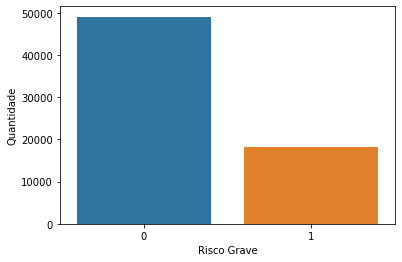

In [90]:
ax = sns.countplot(x="risco", data=acidentes)
ax.set_xlabel('Risco Grave')
ax.set_ylabel('Quantidade')

In [91]:
# Selecionando um dataframe oriundo de "acidentes"  com  somente valores 0, ou seja, sem risco grave.  
data2 = acidentes[acidentes.risco==0].sample(18243)

In [92]:
# adicionando ao dataframe criado a mesma quantidade de valores 1, com risco grave. 
data = data2.append(acidentes[acidentes.risco==1].sample(18243))

In [93]:
data.risco.value_counts()

1    18243
0    18243
Name: risco, dtype: int64

Text(0, 0.5, 'Quantidade')

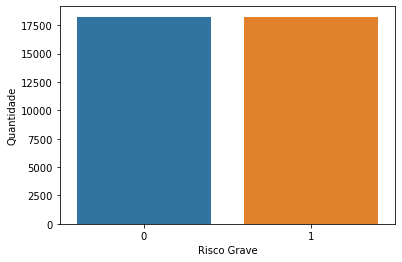

In [94]:
ax = sns.countplot(x="risco", data=data)
ax.set_xlabel('Risco Grave')
ax.set_ylabel('Quantidade')

# CRIAÇÃO DE MODELO DE ML

In [154]:
# Importando as bibliotecas e funções utilizadas no modelo
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import joblib
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

In [163]:
# Separando os atributos da classe
X_train = data.drop('risco',axis=1)
y = data['risco']

In [164]:
# Separando os dados de treino e o de teste
X_treino, X_teste, y_treino, y_teste = train_test_split(X_train, y)

## Support Vector Macchine – SVM

In [155]:
svm1 = svm.SVC().fit(X_treino, y_treino)

In [157]:
previsoes = svm1.predict(X_teste)
acuracia = accuracy_score(y_teste, previsoes)
precisao = precision_score(y_teste, previsoes)
revocacao = recall_score(y_teste, previsoes)
confusao = confusion_matrix(y_teste, previsoes)

print('Matriz de Confusão')
print(confusao)
print()
print('Acurácia = ' , acuracia)
print('Precisão = ' , precisao)
print('Revocação = ' , revocacao)
print()

Matriz de Confusão
[[2491 2092]
 [2226 2313]]

Acurácia =  0.5266388949791713
Precisão =  0.5250851305334847
Revocação =  0.5095836087243887



## K-Nearest Neighbor – KNN

In [152]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_treino, y_treino)
previsoes = knn.predict(X_teste)
acuracia = accuracy_score(y_teste, previsoes)
precisao = precision_score(y_teste, previsoes)
revocacao = recall_score(y_teste, previsoes)
confusao = confusion_matrix(y_teste, previsoes)

print('Matriz de Confusão')
print(confusao)
print()
print('Acurácia = ' , acuracia)
print('Precisão = ' , precisao)
print('Revocação = ' , revocacao)
print()


Matriz de Confusão
[[2371 2212]
 [2147 2392]]

Acurácia =  0.5221442666081999
Precisão =  0.5195482189400521
Revocação =  0.5269883234192554



## Random Forest

In [168]:
rf = RandomForestClassifier(n_estimators = 1)  
rf.fit(X_treino, y_treino)

RandomForestClassifier(n_estimators=1)

In [169]:
previsoes = rf.predict(X_teste)
acuracia = accuracy_score(y_teste, previsoes)
precisao = precision_score(y_teste, previsoes)
revocacao = recall_score(y_teste, previsoes)
confusao = confusion_matrix(y_teste, previsoes)

print('Matriz de Confusão')
print(confusao)
print()
print('Acurácia = ' , acuracia)
print('Precisão = ' , precisao)
print('Revocação = ' , revocacao)
print()

Matriz de Confusão
[[2849 1733]
 [1676 2864]]

Acurácia =  0.626288094716071
Precisão =  0.6230150097889928
Revocação =  0.6308370044052863



# PIPELINE

### Utilizando a classe Pipeline do sklearn para criar três objetos, um para cada algoritmo

In [96]:
pipe_random_forest = Pipeline([
        ('scl', StandardScaler()),
        ('clf', RandomForestClassifier())
        ]
)

In [97]:
pipe_random_forest.steps

[('scl', StandardScaler()), ('clf', RandomForestClassifier())]

In [98]:
pipe_svm = Pipeline([
        ('scl', StandardScaler()),
        ('clf', svm.SVC())
        ]
)

In [99]:
pipe_knn = Pipeline([
        ('scl', StandardScaler()),
        ('clf', KNeighborsClassifier())
        ]
)

# **GridSearch**

O GridSearchCV é uma ferramenta usada para automatizar o processo de ajuste dos parâmetros de um algoritmo, pois ele fará de maneira sistemática diversas combinações dos parâmetros e depois de avaliá-los os armazenará em um único objeto. O GridSearchCV é um módulo do ScikitLearn e é amplamente usado para automatizar grande parte do processo de tuning.

# Valores para Grid

No código abaixo criamos uma lista para alimentar as grids que vão ser utilizadas no parâmetro do GridSearch para testar as combinações.

# Criando um dicionário de parâmetros que eu quero variar em cada modelo

In [100]:
valores = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [101]:
grid_params_rf = [{
    'clf__criterion': ['gini', 'entropy'],
    'clf__min_samples_leaf': valores,
    'clf__max_depth': valores,
    'clf__min_samples_split': valores[1:]
}]

In [102]:
grid_params_svm = [{
    'clf__kernel': ['linear', 'rbf'], 
    'clf__C': valores
}]

In [103]:
grid_params_knn = [{
    'clf__n_neighbors': valores,
}]

# Construindo GridSearch

In [104]:
gs_rf = GridSearchCV(
    estimator=pipe_random_forest,
    param_grid=grid_params_rf,
    scoring='accuracy',
    verbose=100,
    cv=10 
)

In [105]:
gs_svm = GridSearchCV(
    estimator=pipe_svm,
    param_grid=grid_params_svm,
    scoring='accuracy',
    verbose=100,
    cv=10,
)

In [106]:
gs_knn = GridSearchCV(
    estimator=pipe_knn,
    param_grid=grid_params_knn,
    scoring='accuracy',
    verbose=100,
    cv=10,
)

In [107]:
# Deletando a variável alvo e alimentando a mesma em Y
X_train = data.drop('risco',axis=1)
y = data['risco']

# Computando o GridSearch para Random Forest

O método fit() é utilizado para treinar o algorítimo e verificar seu desempenho.

#### Uma grande capacidade computacional foi requerida no uso dos algoritmos abaixo. Por isso, gastou muito tempo e grande parte do script

In [144]:
gs_rf.fit(X_train,y)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
[CV 1/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 1/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.7s
[CV 2/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 2/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.5s
[CV 3/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 3/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2; total time=   0.5s
[CV 4/10; 1/1800] START clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, clf__min_samples_split=2
[CV 4/10; 1/1800] END clf__criterion=gini, clf__max_depth=1, clf__min_samples_leaf=1, cl

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('clf', RandomForestClassifier())]),
             param_grid=[{'clf__criterion': ['gini', 'entropy'],
                          'clf__max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                          'clf__min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                    10],
                          'clf__min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9,
                                                     10]}],
             scoring='accuracy', verbose=100)

In [145]:
# Melhores parametros e scoring
print('Melhores parâmetros: %s' % gs_rf.best_params_)
print('Melhores Acurácia: %.3f' % gs_rf.best_score_)

Melhores parâmetros: {'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__min_samples_leaf': 3, 'clf__min_samples_split': 9}
Melhores Acurácia: 0.713


# Computando o GridSearch para SVM

In [146]:
gs_svm.fit(X_train,y)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
[CV 1/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 1/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 2/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 2/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.2min
[CV 3/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 3/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 4/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 4/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 5/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 5/10; 1/20] END ............clf__C=1, clf__kernel=linear; total time= 1.3min
[CV 6/10; 1/20] START clf__C=1, clf__kernel=linear..............................
[CV 6/10; 1/20] END ............clf__C=1, clf_

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('clf', SVC())]),
             param_grid=[{'clf__C': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                          'clf__kernel': ['linear', 'rbf']}],
             scoring='accuracy', verbose=100)

In [147]:
# Melhores parametros e scoring
print('Melhores parâmetros: %s' % gs_svm.best_params_)
print('Melhores Acurácia: %.3f' % gs_svm.best_score_)

Melhores parâmetros: {'clf__C': 1, 'clf__kernel': 'rbf'}
Melhores Acurácia: 0.691


# Computando o GridSearch para KNN

In [148]:
gs_knn.fit(X_train,y)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10; 1/10] START clf__n_neighbors=1........................................
[CV 1/10; 1/10] END ......................clf__n_neighbors=1; total time=   2.0s
[CV 2/10; 1/10] START clf__n_neighbors=1........................................
[CV 2/10; 1/10] END ......................clf__n_neighbors=1; total time=   2.0s
[CV 3/10; 1/10] START clf__n_neighbors=1........................................
[CV 3/10; 1/10] END ......................clf__n_neighbors=1; total time=   1.9s
[CV 4/10; 1/10] START clf__n_neighbors=1........................................
[CV 4/10; 1/10] END ......................clf__n_neighbors=1; total time=   2.0s
[CV 5/10; 1/10] START clf__n_neighbors=1........................................
[CV 5/10; 1/10] END ......................clf__n_neighbors=1; total time=   1.9s
[CV 6/10; 1/10] START clf__n_neighbors=1........................................
[CV 6/10; 1/10] END ......................clf_

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scl', StandardScaler()),
                                       ('clf', KNeighborsClassifier())]),
             param_grid=[{'clf__n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}],
             scoring='accuracy', verbose=100)

In [149]:
# Melhores parametros e scoring
print('Melhores parâmetros: %s' % gs_knn.best_params_)
print('Melhores Acurácia: %.3f' % gs_knn.best_score_)

Melhores parâmetros: {'clf__n_neighbors': 10}
Melhores Acurácia: 0.653


# **Escolha do algorítimo de melhor desempenho**

Depois de verificar a melhor acurácia entres os três algoritmos, foi visto que o RANDOM FOREST foi que teve o melhor desempenho, com isso foi o escolhido para ser utilizado em nosso modelo. Além do mais, todos apresentaram uma performance melhor do que os primeiros.

# Métricas de Validação



In [162]:
print (pd.crosstab(y_teste, gs_rf.predict(X_teste), rownames=['Real'], colnames=['Predito'], margins=True), '')

Predito     0     1   All
Real                     
0        3747   802  4549
1        1631  2942  4573
All      5378  3744  9122 


In [224]:
print (metrics.classification_report(y_teste,gs_rf.predict(X_teste)))

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4549
           1       0.78      0.63      0.70      4573

    accuracy                           0.73      9122
   macro avg       0.74      0.73      0.72      9122
weighted avg       0.74      0.73      0.72      9122



# COMUNICAÇÃO DOS RESULTADOS
Persistindo o modelo de Machine Learning para o disco.
Persistir o modelo para o disco, nada mais é de tirar da memória o modelo e coloca no seu disco físico, para com isso ser utilizado da forma que você quiser, ser implemntado em um sistema de terceiros por exemplo.

# Persistindo o modelo de Machine Learning para o disco.

Persistir o modelo para o disco, nada mais é de tirar da memória o modelo e coloca no seu disco físico, para com isso ser utilizado da forma que você quiser, ser implemntado em um sistema de terceiros por exemplo.

In [154]:
# Importando a biblioteca joblid, utilizada para persistir o modelo em disco
import joblib

In [188]:
# Persistindo o melhor modelo em disco.
joblib.dump(gs_rf, 'model.pkl')

['model.pkl']

# Carregando o modelo a partir do disco para a memória.
Lendo o modelo que está no disco

In [189]:
model = joblib.load('model.pkl')

In [190]:
print("Atributos do Modelo:\n\nClasses:{}\nEstimator:{}".format(model.classes_,model.estimator))

Atributos do Modelo:

Classes:[0 1]
Estimator:Pipeline(steps=[('scl', StandardScaler()), ('clf', RandomForestClassifier())])


# Verificando o Dataset final gerado.

In [191]:
X_train.head()

,dia_semana,horario,uf,br,km,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,veiculos,tipo_veiculo
91829,0,577,12,116.0,3175,7,0,2,1,0,2,1,0,2,4
101226,0,992,18,495.0,444,8,0,3,0,4,2,1,0,1,4
56917,6,288,10,158.0,5429,3,0,1,0,0,2,1,0,1,8
2331,0,425,12,50.0,1555,1,0,2,0,7,1,1,0,2,11
24952,1,936,20,470.0,2135,12,0,2,1,0,2,1,0,2,4


# Teste de Classificação.
Aque estamos testando nosso modelo, passando para ele uma simulação de dados novos para vermos se ele vai indicar ou não o risco de acidente, o resultado vai ser 0 ou 1 que posteriormente pode ser tratado para o valor False ou True como na base.



In [220]:
teste = np.array([[1,425,16,116.0,3175,1,0,3,0,7,2,1,1,2,7]])

In [221]:
model.predict(teste)

array([0], dtype=int64)

# Probabilidades de Classes
O método predict_proba é utilizado para saber quais as probabilidades de classes a serem retornadas pelo modelo.

In [222]:
model.predict_proba(teste)

array([[0.59236485, 0.40763515]])